##**Business Context**

Traffic Road Sign recognition is one of the most important component of an Automatic Driving Assistance System (ADAS). The system should be able to identify and classify road signs correctly at real-time to help drivers make critical decision while driving. The reliability is not that it should be able to recognize from a benchmark data, but should be able to classify signs that it has never seen before or taken in a different setting. A model that does well on its training set but fails in a different and real data is commercially useless and unsafe.

###**Objective**

To build a traffic road sign classifier that generalizes well beyond one type of data recording. The model will be trained on German Traffic Sign Dataset and will be tested and validated against unseen Beligan Traffic Sign Dataset that has been captured in a different setting with different lighting, background and color variation.

###**Task**

This is a multi-class image classification problem. The output is one of 18 classes that is shared between both German and Belgian traffic sign dataset.  

### **Importing Dependencies**

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
from pathlib import Path
import kagglehub
import random

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

from sklearn.metrics import classification_report, balanced_accuracy_score
import time

In [2]:
SEED = 36

In [3]:
random.seed(SEED)
tf.keras.utils.set_random_seed(SEED)

##**Dataset**

This project uses the [**German GTSRB**](https://https://www.kaggle.com/datasets/meowmeowmeowmeowmeow/gtsrb-german-traffic-sign) and [**Belgian BTSC**](https://www.kaggle.com/datasets/abhi8923shriv/belgium-ts/) traffic sign datasets available on Kaggle. It has been restricted to the sign categories shared between both countries.

The model trains on German signs and is evaluated on unseen Belgian signs to prevent data leakage and evaluate generalization

###**Loading Data**

In [ ]:
g_ts = Path(kagglehub.dataset_download('meowmeowmeowmeowmeow/gtsrb-german-traffic-sign'))

In [ ]:
b_ts = Path(kagglehub.dataset_download('abhi8923shriv/belgium-ts'))

In [6]:
train_ds = g_ts / "Train"
val_ds = b_ts / "BelgiumTSC_Training/Training"
test_ds = b_ts / "BelgiumTSC_Testing/Testing"

In [7]:
german_class_dir = sorted([d for d in train_ds.iterdir() if d.is_dir() and d.name.isdigit()], key=lambda d: int(d.name))

In [8]:
belgian_class_dir = sorted([d for d in val_ds.iterdir() if d.is_dir() and d.name.isdigit()], key=lambda d: int(d.name))

In [9]:
belgian_class_dir_test = sorted([d for d in test_ds.iterdir() if d.is_dir() and d.name.isdigit()], key=lambda d: int(d.name))

##**Data Exploration**

###**Image Extension**

German images are of ".png" extension while Belgian images are of ".ppm" as described and verfied from datasource.

####**Converting .ppm to .png**

Conversion of Belgian Image's extensio is necessary to use it for tensorflow dataset creation.

In [10]:
def convert_ppm_to_png(src_root, dst_root):
  src_root, dst_root = Path(src_root), Path(dst_root)
  for ppm in src_root.rglob("*.ppm"):
      rel = ppm.relative_to(src_root).with_suffix(".png")
      out = dst_root / rel
      out.parent.mkdir(parents=True, exist_ok=True)
      img = cv.imread(str(ppm))
      cv.imwrite(str(out), img)

In [11]:
convert_ppm_to_png(val_ds, "belgian_train_png")

In [12]:
convert_ppm_to_png(test_ds,  "belgian_test_png")

Belgian images with .png file extension can now be accessed from "belgian_train_png" and "belgian_test_png" folders.

###**Image Exploration**

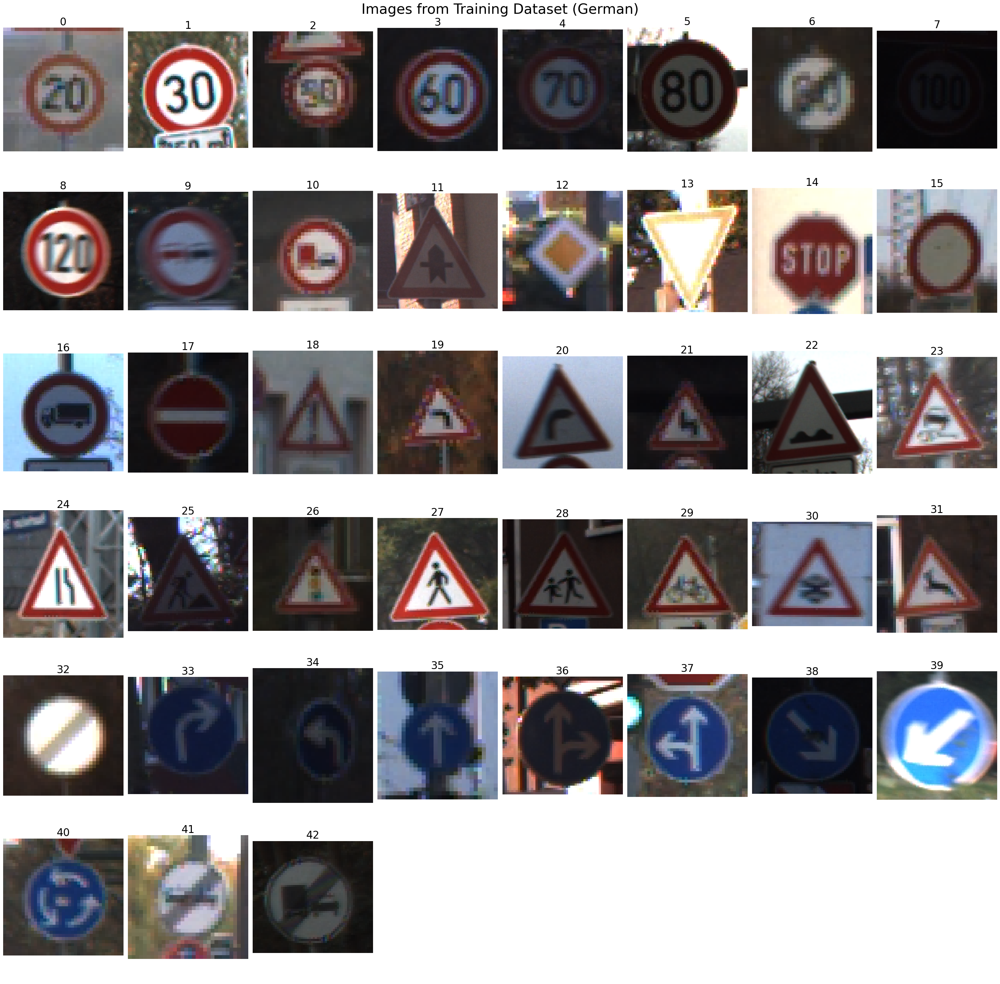

In [13]:
fig, axes = plt.subplots(6, 8, figsize= (32, 32))
for ax, d in zip(axes.flat, german_class_dir):
  imgs = list(d.glob("*.png"))
  if imgs:
    im = cv.cvtColor(cv.imread(random.choice(imgs)), cv.COLOR_BGR2RGB)
    ax.imshow(im)
  ax.set_title(int(d.name), fontsize=24)
  ax.axis('off')
for ax in axes.flat[len(german_class_dir):]:
  ax.axis('off')
plt.suptitle('Images from Training Dataset (German)', fontsize=32)
plt.tight_layout()
plt.show()

The above figure shows German Traffic Sign images with 43 classes. The images has been recorded in realistic scenarios in various lighting settings, different time of the day, some are degraded in quality while some are sharp and easy to read.

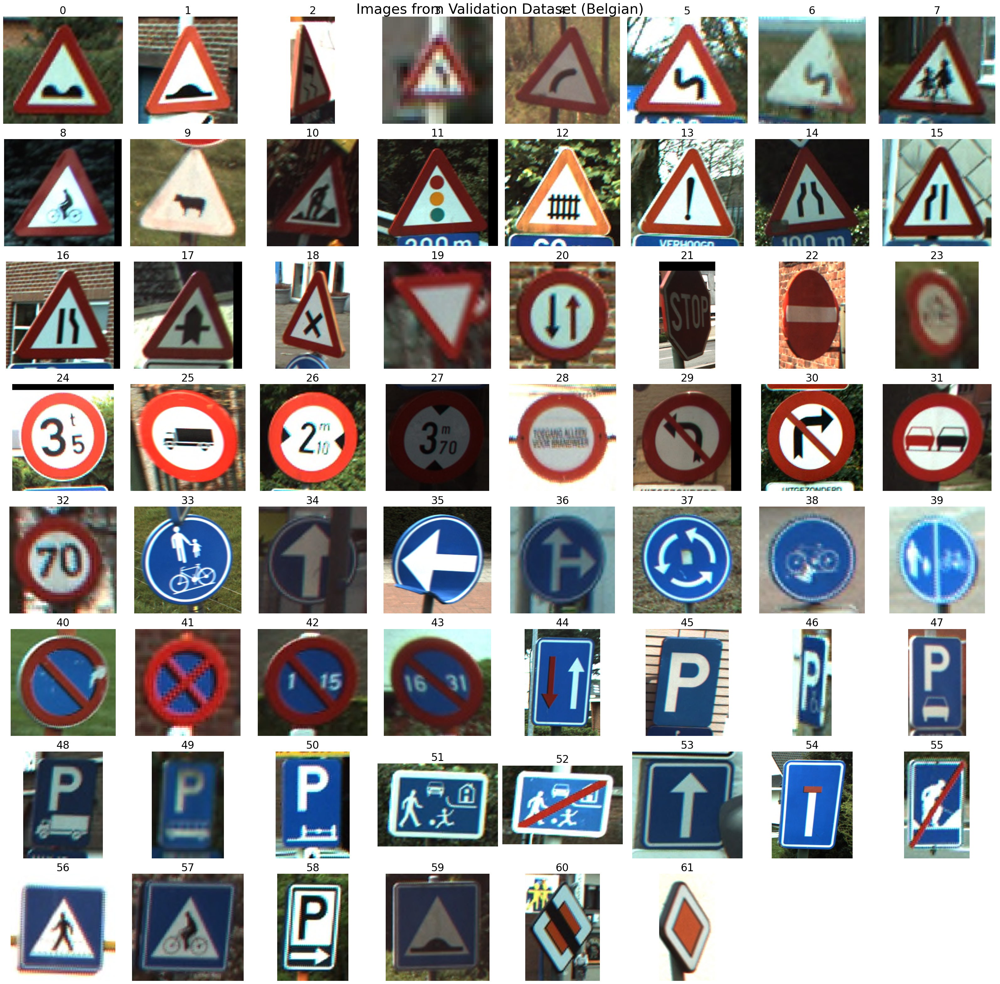

In [14]:
fig, axes = plt.subplots(8, 8, figsize= (32, 32))
for ax, d in zip(axes.flat, belgian_class_dir):
  imgs = list(d.glob("*.ppm"))
  if imgs:
    im = cv.cvtColor(cv.imread(random.choice(imgs)), cv.COLOR_BGR2RGB)
    ax.imshow(im)
  ax.set_title(int(d.name), fontsize=24)
  ax.axis('off')
for ax in axes.flat[len(belgian_class_dir):]:
  ax.axis('off')
plt.suptitle('Images from Validation Dataset (Belgian)', fontsize=32)
plt.tight_layout()
plt.show()

The above figure shows Belgian traffic road sign. The immediate distinction is the number of classes (61). Therefore only common classes will be used for developing neural network and classify traffic signs. The images are also taken in realistic conditions with variety in lighting, quality and some are taken from different angle.

The distiction that can be noticed from German signs is that the pictograms (arrows, icons) varies.

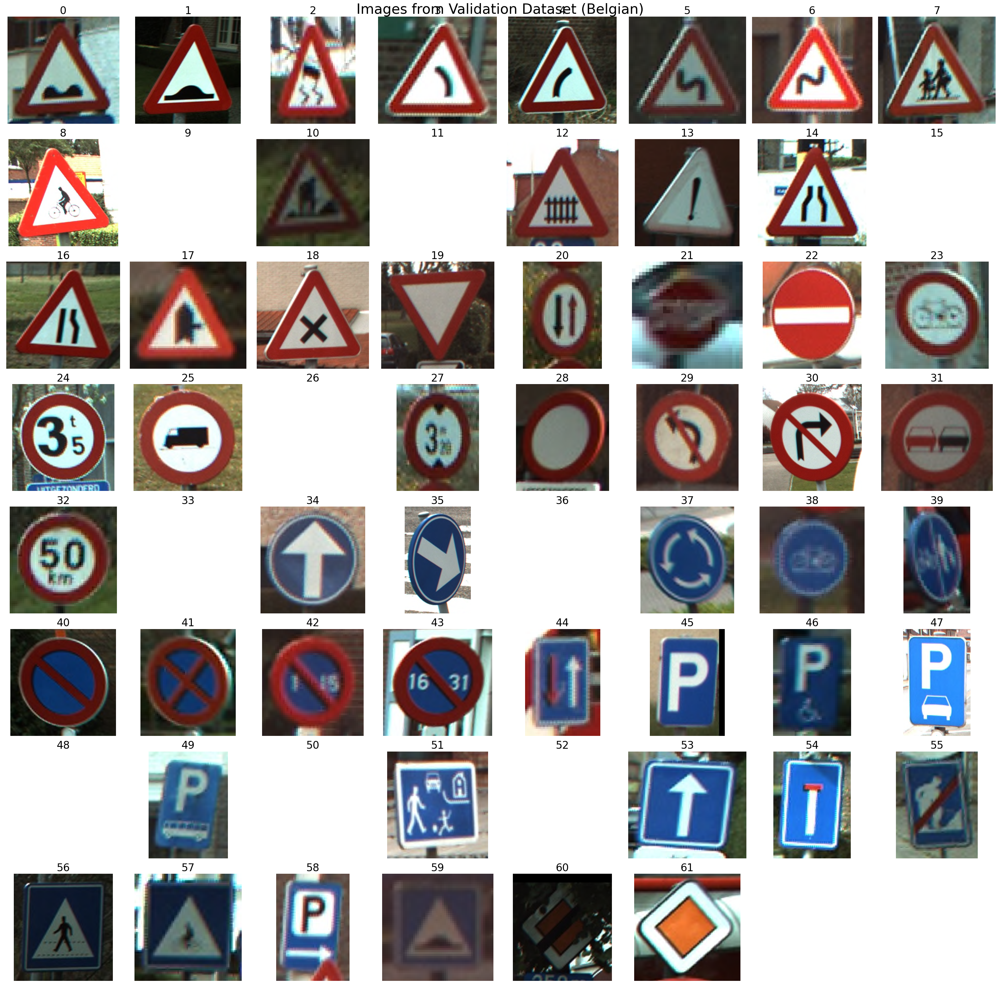

In [15]:
fig, axes = plt.subplots(8, 8, figsize= (32, 32))
for ax, d in zip(axes.flat, belgian_class_dir_test):
  imgs = list(d.glob("*.ppm"))
  if imgs:
    im = cv.cvtColor(cv.imread(random.choice(imgs)), cv.COLOR_BGR2RGB)
    ax.imshow(im)
  ax.set_title(int(d.name), fontsize=24)
  ax.axis('off')
for ax in axes.flat[len(belgian_class_dir):]:
  ax.axis('off')
plt.suptitle('Images from Validation Dataset (Belgian)', fontsize=32)
plt.tight_layout()
plt.show()

###**Common Class Comparison**

Looking at both the figure above, a common image class is taken to explore the image style in both dataset.

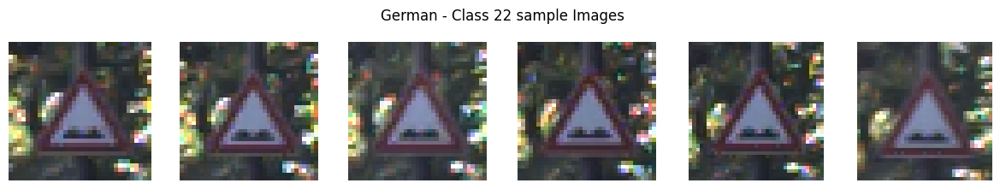

In [16]:
class_folder = f"{train_ds}/22"
paths = sorted(Path(class_folder).glob("*"))[:6]
plt.figure(figsize=(12, 4))
for i, p in enumerate(paths):
    plt.subplot(2, 6, i + 1)
    plt.imshow(plt.imread(str(p)))
    plt.axis("off")
plt.suptitle("German - Class 22 sample Images")
plt.tight_layout()
plt.show()

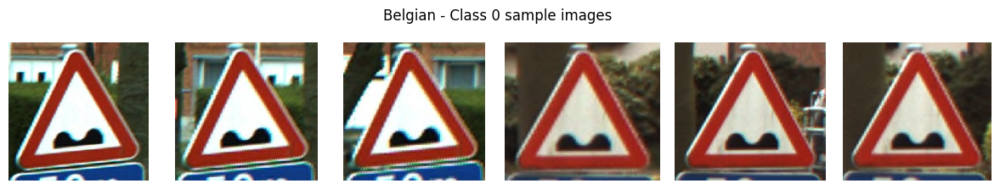

In [17]:
class_folder = f"{val_ds}/00000"
paths = sorted(Path(class_folder).glob("*"))[:6]
plt.figure(figsize=(12, 4))
for i, p in enumerate(paths):
    plt.subplot(2, 6, i + 1)
    plt.imshow(plt.imread(str(p)))
    plt.axis("off")
plt.suptitle("Belgian - Class 0 sample images")
plt.tight_layout()
plt.show()

From the above two figure, it is clear that the images of the each country specific image in the same class has similar looking images, since it was taken keyframe-to-keyframe from the same video source.

This also justifies the need of two dataset where the model is trained on one dataset and is validated and tested on a different unseen images.

###**Target Classes**

A manual approach was taken to identify common classes for both German and Beligian image. Initially 19 common classes was observed between Germand and Belgian data but was reduced to 18 classes as test set missed images for one class. Each class are mapped with a name so that it is easy to follow. The structure is as follow: <br>
('Name of the Traffic Sign', 'German Class Target Value', 'Belgian Sign Target Value')

In [18]:
SHARED = [
    ("intersection_ahead",  11,  17),
    ("priority_road",       12,  61),
    ("yield",               13,  19),
    ("stop",                14,  21),
    ("no_vehicles",         15,  28),
    ("no_vehicles_3.5t",    16,  25),
    ("no_entry",            17,  22),
    ("general_caution",     18,  13),
    ("curve_left",          19,   3),
    ("curve_right",         20,   4),
    ("double_curve",        21,   5),
    ("bumpy_road",          22,   0),
    ("slippery_road",       23,   2),
    ("narrow_road_right",   24,  16),
    ("road_works",          25,  10),
    ("children",            28,   7),
    ("go_straight",         35,  34),
    ("roundabout",          40,  37),
]

In [19]:
num_classes = len(SHARED)

In [20]:
NAMES_OF_TARGET = [name for (name, g, b) in SHARED]

In [21]:
german_classes  = [str(g) for (_, g, _) in SHARED]

In [22]:
belgian_classes = [f"{b:05d}" for (_, _, b) in SHARED]

##**Class Distribution**

In [23]:
def count_images(directory, folders):
    return [len(list(Path(directory, f).glob("*"))) for f in folders]

In [24]:
german = count_images(train_ds, german_classes)
belgian = count_images(test_ds, belgian_classes)

In [25]:
y = np.arange(len(NAMES_OF_TARGET))

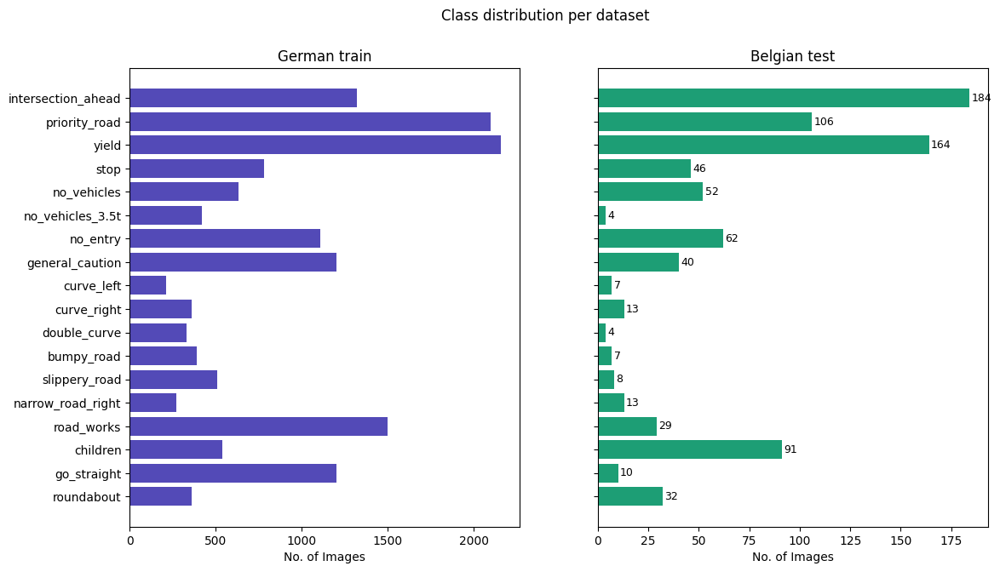

In [26]:
fig, ax = plt.subplots(1, 2, figsize=(13, 7), sharey=True)

ax[0].barh(y, german, color="#534AB7")
ax[0].set(yticks=y, yticklabels=NAMES_OF_TARGET, title="German train", xlabel="No. of Images")
ax[0].invert_yaxis()

ax[1].barh(y, belgian, color="#1D9E75")
ax[1].set(title="Belgian test", xlabel="No. of Images")
for i, v in enumerate(belgian):
    ax[1].text(v + 1, i, v, va="center", fontsize=9)

plt.suptitle("Class distribution per dataset")
plt.show()

The above figure shows the class distribution of both dataset and is clear that both has class imbalance. The belgian dataset is more severely imbalance as ~50% of classes has less than 15 samples each. This imbalance motivates reporting "**balanced accuracy**" rather than relying only on overall accuracy to correctly evaluate model's performance.

##**Creating Dataset**

###**German Dataset - For Training**

In [27]:
gr_train = tf.keras.utils.image_dataset_from_directory(
    train_ds,
    class_names=german_classes,
    label_mode="categorical",
    image_size=(32, 32),
    batch_size=64,
    seed=SEED,
    validation_split=0.2,
    subset="training"
)

Found 15390 files belonging to 18 classes.
Using 12312 files for training.


In [28]:
gr_val = tf.keras.utils.image_dataset_from_directory(
    train_ds,
    class_names=german_classes,
    label_mode="categorical",
    image_size=(32, 32),
    batch_size=64,
    seed=SEED,
    validation_split=0.2,
    subset="validation"
)

Found 15390 files belonging to 18 classes.
Using 3078 files for validation.


###**Belgian Dataset - For Validation and Test**

In [29]:
bl_test = tf.keras.utils.image_dataset_from_directory(
    "belgian_test_png",
    class_names=belgian_classes,
    label_mode="categorical",
    image_size=(32, 32),
    batch_size=64,
    shuffle=False
)

Found 854 files belonging to 18 classes.


In [30]:
bl_val = tf.keras.utils.image_dataset_from_directory(
    "belgian_train_png",
    class_names=belgian_classes,
    label_mode="categorical",
    image_size=(32, 32),
    batch_size=64
)

Found 1667 files belonging to 18 classes.


Training dataset has 12312 samples, validation (belgian) dataset has 1667, and test (belgian) dataset has 854 samples.

##**Best Model**

The model's architecture is loosely inspired from Mishra, J & Goyal, S (2022). The model uses stacked convolutional layers before pooling. Due to the stacked convolutional architecture the model gains depth and larger receptive field and enables it to learn richer features without extra pooling. In a traditional approach with more depth, pooling shrinks the feature map before reaching enough depth.

For a 32x32 size image classification, relying on pooling to add depth would collapse the feature map quickly (with 4 pooling layers the map would be 2x2). In contrast, using this architecture allows more depth without reducing the feature map severely at the final stage.

In [31]:
LR = 0.001

In [32]:
EPOCHS = 30

In [33]:
model = keras.Sequential([
    layers.Input((32,32,3)),
    layers.Rescaling(1./255),

    layers.Conv2D(32, 3, padding='same', kernel_initializer='he_normal'),
    layers.BatchNormalization(), layers.Activation('relu'),
    layers.Conv2D(32, 3, padding='same', kernel_initializer='he_normal'),
    layers.BatchNormalization(), layers.Activation('relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(64, 3, padding='same', kernel_initializer='he_normal'),
    layers.BatchNormalization(), layers.Activation('relu'),
    layers.Conv2D(64, 3, padding='same', kernel_initializer='he_normal'),
    layers.BatchNormalization(), layers.Activation('relu'),
    layers.MaxPooling2D(),


    layers.Conv2D(128, 3, padding='same', kernel_initializer='he_normal'),
    layers.BatchNormalization(), layers.Activation('relu'),
    layers.Conv2D(128, 3, padding='same', kernel_initializer='he_normal'),
    layers.BatchNormalization(), layers.Activation('relu'),
    layers.MaxPooling2D(),

    layers.Flatten(),
    layers.Dense(128, activation='relu', kernel_initializer='he_normal'),
    layers.Dropout(0.3),
    layers.Dense(num_classes, activation='softmax')
])

In [34]:
model.compile(
    keras.optimizers.Adam(LR),
    'categorical_crossentropy',
    metrics=['accuracy']
)

In [35]:
t=time.perf_counter()
h=model.fit(
    gr_train,
    validation_data=bl_val,
    epochs=EPOCHS,
    verbose=0,
    callbacks=[
      EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True),
      ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=0.000001)
  ])
el=time.perf_counter()-t

In [36]:
ne=len(h.history['loss'])
vl , va = model.evaluate(bl_val, verbose = 0)

In [37]:
print(f"Validation Accuracy: {round(va, 4)}\nValidation Loss {round(vl, 4)}\nEpochs: {ne}\nTotal (s): {round(el, 1)}\nPer-Epoch (s): {round(el/ne, 2)}")

Validation Accuracy: 0.9592
Validation Loss 0.2195
Epochs: 17
Total (s): 154.3
Per-Epoch (s): 9.08


##**Experiments**

An ablation experiment was performed to understand how each components affects the base model. The results of the experiements are presented below:

| Model  | Val. Accuracy | Val. Loss    | Training Time  | Epochs  | Seconds/ep.  | Rationale |
|:-|-|-|-|-|-|:-|
|**Best Model** |95.92%   |0.2195    |154.3s  | 17 | 9.08s | The chosen configuration for this task |

|S.N.| Experiments  | Val. Accuracy | Val. Loss    | Training Time  | Epochs  | Seconds/ep.  | Rationale |
|:-:|-|-|-|-|-|-|:-|
|1|Single Convolutional Layer (No Stacking) |93.82%   |0.2754    |75.2s  | 9 | 8.35 | Accuracy decreased by ~2% and loss increased slightly.  Single convolutional layer trained faster but it lost the advantage of large receptoive fields to learn patterns better.|
|2|Changing Image size |93.46%   |0.2795    |81.7s  | 9 | 9.08 | Accuracy decreased by ~2.5% with an increased loss. Making images larger provided no gain.|
|3|With Augmentation (Rotation and Brightness) |93.22%   |0.2778    |83.4s  | 9 | 9.26 | Adding augmentation degraded both accuracy and loss. Adding rotation and brightness added complexity which disrupted the model's feature learning.|
|4|Removing Dropout |93.16%   |0.3026    |149.1s  | 17 | 8.77 |Accuracy fell by ~2.75% and loss increased by ~0.09. Indicating dropout regularization is necessary for optimal performance.|
|5|Classification head changed to Global Average Pooling|92.5%   |0.2859    |95.4s  | 11 | 8.68 |Replacing dense hidden layer with GAP reduced model parameters which also reduced its capability which decreased accuracy by ~3.4% and increased loss value by ~0.07.|
|6|Removing Batch Normalization |91.66%   |0.4787    |71.2s  | 8 | 8.9 |Removing BatchNorm more than doubled the loss and reduced accuracy by ~4.2%. Without batch normalization the model does not perform well.|
|7|Changing color to Grayscale |91.66%   |0.3096    |113.7s  | 9 | 12.64 |Removing color cost ~4.2% accuracy, showing color is important for this classification.|
|8|Reducing Network Depth (3 to 2) |90.52%   |0.3946    |71.5s  | 8 | 8.94 |Removing final stage shortened feature learning, reduced accuracy by ~5.5%. The extra depth is necessary for model to learn important patterns.|
|9|Changing Normalization to Standard Channel |84.58%   |0.5971    |174.2  | 20 | 8.71 | A channel standardization decreased accuracy by ~11% while also having more than doubled loss. A simple minmax standardization is suitable for this pipeline. |
|10|Different learning rate (0.01) |61.31%   |0.9834    |95.2s  | 11 | 8.65 |Increasing the learning rate proved to be catastrophic. Reduced the accruacy by ~35% and increased the loss by 4.5x. The learning rate of 0.001 proves to be well suited.|

Every change made to the "final model" has decreased validation accuracy and increase validation loss. This indicates that each design choices made for the final model has contributed towards its performance.

Some had small effect (like Exp. 01, Exp. 02), while others had large effect (Exp. 10, Exp. 09), presenting a strong eveidence that these design decisions are important for the best model.

While some models trained faster like (Exp. 01, Exp. 02 and Exp. 03), a trade-off between accuracy and loss was considering it as heigh weighted for the final decision.

Overall, the experiments show that the design decision taken to build the final model all contributes towards it's better performance on accuracy, loss and training time combined.

##**Prediction**

###**On German Validation Data**

In [38]:
grv_loss, grv_acc = model.evaluate(gr_val, verbose=0)

In [39]:
print(f"German Validation Accuracy : {grv_acc*100:.2f}%")
print(f"German Validation Loss : {grv_loss:.4f}")

German Validation Accuracy : 99.90%
German Validation Loss : 0.0046


###**On Test Data**

In [55]:
te_loss, te_acc = model.evaluate(bl_test, verbose=0)

In [56]:
print(f"Test Accuracy : {te_acc*100:.2f}%")
print(f"Test Loss : {te_loss:.4f}")

Test Accuracy : 97.78%
Test Loss : 0.1123


The final model achieved an accuracy of 97.78% on test data which is above the level of the validation (belgian) accuracy of 95.92% but with a lower loss of 0.1123. This indicates that the model has learned generalization features from the German Data Set to get a good accuracy on held-out Belgian test set.

To contrast the importance of cross country data, the model was also evaluated once on the German Validation Data. It scored an accuracy of 99.9% and a loss of 0.004. This does not make the model perfect, but raises an issue of optimistic prediction and unreliable conclusion. The German dataset has near-duplicate images, therefore using it for training and testing would not give the actual model performance. The 2-point gap, illustrates the importance of having two different datasets for such classification tasks, as high numbers would have hidden the model's true generalization performance.

##**Evaluation and Analysis**

###**Per Class Analysis**

In [42]:
y_true = np.concatenate([np.argmax(y, axis=1) for X, y in bl_test], axis=0)

In [43]:
y_pred = np.argmax(model.predict(bl_test, verbose=0), axis=1)

In [44]:
unique_true_y = sorted(np.unique(y_true))

In [45]:
names = [NAMES_OF_TARGET[i] for i in unique_true_y]

In [46]:
print(classification_report(y_true, y_pred,
                            target_names=names,
                            labels=unique_true_y, zero_division=0))

                    precision    recall  f1-score   support

intersection_ahead       0.96      0.99      0.98       183
     priority_road       0.98      1.00      0.99       105
             yield       0.99      1.00      0.99       163
              stop       1.00      1.00      1.00        45
       no_vehicles       1.00      0.96      0.98        51
  no_vehicles_3.5t       1.00      1.00      1.00         3
          no_entry       1.00      1.00      1.00        61
   general_caution       1.00      0.92      0.96        39
        curve_left       1.00      0.50      0.67         6
       curve_right       0.77      0.83      0.80        12
      double_curve       0.75      1.00      0.86         3
        bumpy_road       1.00      1.00      1.00         6
     slippery_road       1.00      0.71      0.83         7
 narrow_road_right       0.80      1.00      0.89        12
        road_works       1.00      1.00      1.00        28
          children       0.99      0.93

The per-class classification report above suggests that the model performs reliably on well sampled classes. Performance on low sampled classes are uneven with classes such as 'curve_left' has '0.5' and 'slipery_road' has '0.71' recall. On the other hand classes like 'double_curve' and 'bumpy_road' has a recall value of '1'. All of these classes are low sampled classes which describes the swings in the result where a single misclassification can shift the value drastically.

This is reflective by the difference between macro average F1 (0.94) and weighted average F1 (0.98). This confirms that that model classifies common classes better than under represented classes, a direct concequences of imbalanced dataset.

###**Balanced Accuracy**

###**All common classes**

In [47]:
ba_acc = balanced_accuracy_score(y_true, y_pred)

In [48]:
print(f"Balanced accuracy (all present classes): {ba_acc*100:.2f}%")

Balanced accuracy (all present classes): 93.66%



###**For Samples above 30.**

In [49]:
MIN_SAMPLES = 30

In [50]:
counts_per_class = np.bincount(y_true, minlength=num_classes)

In [51]:
classes_above_min = [c for c in unique_true_y if counts_per_class[c] >= MIN_SAMPLES]

In [52]:
mask = np.isin(y_true, classes_above_min)

In [ ]:
ba_above_min = balanced_accuracy_score(y_true[mask], y_pred[mask])

In [54]:
print(f"Balanced accuracy (For classes with samples more than {MIN_SAMPLES}): {ba_above_min*100:.2f}%")

Balanced accuracy (For classes with samples more than 30): 97.91%


To summarize the evaluation, balanced accuracy on all common classes is 93.66% (~4% lower), which treats every class weight equally. Whereas the balanced accuracy for classes which had more than 30 samples is 97.91% closely matching its overall accuracy. This indicates that the model does well with all classes, the lower balanced accuracy is occured by rare instances of classes with extremely low sample count, where too few images makes the score unreliable. This is a limit of the test data, not the model.

##**Final Discussion**

###**Strengths**

- The pipeline follows a standard data science process: problem framing, data exploration, pre-processing, model-training, experiments and evaluation.
- The model trains on German dataset, and evaluates on an unseen Belgian dataset giving an honest preview of how well the model generalizes.
- This project solves a real-world problem. In ADAS, traffic sign classification has a genuine saftey-value.
- The final model was loosely inspired by proven research and was supported by ablation experiments, where each design choices was tested and shown to have impact on the model's performance.
- Evaluation used robust metrics was suited for class imbalance data, and balanced accuracy was used for reliable evalutaion over overall accuracy.
- Class imbalance was handled with honesty by introducing balanced accuracy for well sampled classes.

###**Limitations**

- The dataset is small and contains near duplicate images taken from the same video feed, giving the model less unique trainable features.
- Several classes had very few samples making their per-class results uneven.
- Only two country data was used. To create more robust system a mix of different countries data can be used.

###**Business Implications**

The model is strong but not perfect yet.
- Since it was tested across two countries, it shows strong generalization capability across different country signs.
- However, it is slightly unreliable on low sampled classes, this will create a safety concern if the signs are critical.

###**Data-Driven Recommendation**

- Collect more data to address imbalance and low sample count on the dataset.
- Test on more country's dataset to confirm model's generability.
- The model is not ready to deploy because of how unreliably it performed on low sample count classes.
- This model can be used further to fine-tune on more dataset, as it has proven to generalize well by classifying well on unseed cross-country dataset.

##**Reference**

Mishra, J. and Goyal, S. 2022. An effective automatic traffic sign classification and recognition deep convolutional networks. Multimedia Tools Application, 81:18915–18934. https://doi.org/10.1007/s11042-022-12531-w